In [2]:

# IMPORTANT: SOME KAGGLE DATA SOURCES ARE PRIVATE
# RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES.
import kagglehub
kagglehub.login()


Kaggle credentials set.
Kaggle credentials successfully validated.


In [3]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

import zipfile
import os

ethz_cil_monocular_depth_estimation_2025_path = kagglehub.competition_download('ethz-cil-monocular-depth-estimation-2025')

print('Data source import complete.')

Data source import complete.


In [4]:
dataset_dir = ethz_cil_monocular_depth_estimation_2025_path
print("Dataset directory:", dataset_dir)

# List what's inside
print("Contents:")
print(os.listdir(dataset_dir))

Dataset directory: /root/.cache/kagglehub/competitions/ethz-cil-monocular-depth-estimation-2025
Contents:
['test_list.txt', 'test', 'train_list.txt', 'create_prediction_csv.py', 'train']


In [5]:
# Imports
import torch
from PIL import Image
from torchvision import transforms
import torchvision.transforms.functional as TF
from torch.utils.data import Dataset, DataLoader
import numpy as np
from transformers import DPTForDepthEstimation
from tqdm import tqdm
import torch.nn as nn
import matplotlib.pyplot as plt
import cv2

In [6]:
# Paths & Hyperparameters
DATA_DIR      = '/root/.cache/kagglehub/competitions/ethz-cil-monocular-depth-estimation-2025'
TRAIN_DIR     = os.path.join(DATA_DIR, 'train/train')
TEST_DIR      = os.path.join(DATA_DIR, 'test/test')
TRAIN_LIST    = os.path.join(DATA_DIR, 'train_list.txt')
TEST_LIST     = os.path.join(DATA_DIR, 'test_list.txt')
RESULTS_DIR   = '/content'
PRED_DIR      = '/content'

BATCH_SIZE    = 1
LEARNING_RATE = 1e-5
EPOCHS        = 10
INPUT_SIZE    = (426, 560)
MIDAS_SIZE    = (512, 512)
H             = 512
W             = 512
NUM_WORKERS   = 8
PIN_MEMORY    = True
DEVICE        = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [7]:
import os

file_count = len([f for f in os.listdir(TRAIN_DIR) if os.path.isfile(os.path.join(TRAIN_DIR, f))])
print(f"Number of files in TRAIN_DIR: {file_count}")


Number of files in TRAIN_DIR: 47942


In [8]:
def ensure_dir(directory):
    if not os.path.exists(directory):
        os.makedirs(directory)

In [ ]:
depth_map = np.load(os.path.join(TRAIN_DIR, 'sample_024230_depth.npy'))
print(depth_map.size)

238560


In [ ]:
depth_map = np.load(os.path.join(TRAIN_DIR, 'sample_024212_depth.npy'))
print(depth_map.size)

image = Image.open(os.path.join(TRAIN_DIR, 'sample_024212_rgb.png'))
print(image.size)

238560
(560, 426)


In [ ]:
def mask_diff_simple(gt_depth, pred_depth):
  # Compute absolute error between prediction and ground truth
  abs_error = np.abs(pred_depth - gt_depth)

  # Threshold the error to identify reflective/erroneous regions
  error_threshold = 0.3 * (np.max(gt_depth) - np.min(gt_depth))
  mask = abs_error > error_threshold

  return mask

In [ ]:
def mask_diff_norm(gt_depth, pred_depth):
  # Normalise maps
  gt_depth = (gt_depth - np.min(gt_depth)) / (np.max(gt_depth) - np.min(gt_depth))
  pred_depth = (pred_depth - np.min(pred_depth)) / (np.max(pred_depth) - np.min(pred_depth))

  # Compute absolute error between prediction and ground truth
  abs_error = np.abs(pred_depth - gt_depth)

  # Threshold the error to identify reflective/erroneous regions
  error_threshold = 0.3 * (np.max(gt_depth) - np.min(gt_depth))
  mask = abs_error > error_threshold

  return mask

In [ ]:
def mask_diff_log(gt_depth, pred_depth):
  # Log transform maps
  gt_depth = np.log(gt_depth)
  pred_depth = np.log(pred_depth)

  # Normalise maps
  gt_depth = (gt_depth - np.min(gt_depth)) / (np.max(gt_depth) - np.min(gt_depth))
  pred_depth = (pred_depth - np.min(pred_depth)) / (np.max(pred_depth) - np.min(pred_depth))

  # Compute absolute error between prediction and ground truth
  abs_error = np.abs(pred_depth - gt_depth)

  # Threshold the error to identify reflective/erroneous regions
  error_threshold = 0.2 * (np.max(gt_depth) - np.min(gt_depth))
  mask = abs_error > error_threshold

  return mask

In [ ]:
def log_space_mask(gt_depth, pred_depth, threshold=0.2):
    # Ensure numerical stability (avoid log(0))
    eps = 1e-6
    valid_mask = (gt_depth > 0) & (pred_depth > 0) & np.isfinite(gt_depth) & np.isfinite(pred_depth)

    log_gt = np.log(gt_depth[valid_mask] + eps)
    log_pred = np.log(pred_depth[valid_mask] + eps)

    # Compute absolute difference in log space
    log_diff = np.abs(log_pred - log_gt)

    # Create a mask for regions where the log error is too high
    mask = np.zeros_like(gt_depth, dtype=bool)
    mask[valid_mask] = log_diff > threshold

    return mask

In [ ]:
def log_space_mask_adaptive(gt_depth, pred_depth, percentile=95):
    eps = 1e-6
    valid_mask = (gt_depth > 0) & (pred_depth > 0) & np.isfinite(gt_depth) & np.isfinite(pred_depth)

    log_gt = np.log(gt_depth[valid_mask] + eps)
    log_pred = np.log(pred_depth[valid_mask] + eps)

    log_diff = np.abs(log_pred - log_gt)

    # Choose adaptive threshold based on percentile
    threshold = np.percentile(log_diff, percentile)

    # Create the mask
    mask = np.zeros_like(gt_depth, dtype=bool)
    mask[valid_mask] = log_diff > threshold

    return mask

In [ ]:
def log_space_mask_stats(gt_depth, pred_depth, k=1.5):
    eps = 1e-6
    valid_mask = (gt_depth > 0) & (pred_depth > 0) & np.isfinite(gt_depth) & np.isfinite(pred_depth)

    log_gt = np.log(gt_depth[valid_mask] + eps)
    log_pred = np.log(pred_depth[valid_mask] + eps)

    log_diff = np.abs(log_pred - log_gt)
    mu = np.mean(log_diff)
    sigma = np.std(log_diff)
    threshold = mu + k * sigma

    mask = np.zeros_like(gt_depth, dtype=bool)
    mask[valid_mask] = log_diff > threshold

    return mask

In [ ]:
def get_depth_bins(gt_depth, n_bins):
    # Exclude invalid values
    valid = (gt_depth > 0) & np.isfinite(gt_depth)
    percentiles = np.percentile(gt_depth[valid], np.linspace(0, 100, n_bins + 1))
    return percentiles

def multi_bin_log_mask(gt_depth, pred_depth, n_bins=20, k=1.5, min_pixels=100):
    bin_edges = get_depth_bins(gt_depth, n_bins)
    combined_mask = np.zeros_like(gt_depth, dtype=bool)

    eps = 1e-6
    for i in range(n_bins):
        d_min, d_max = bin_edges[i], bin_edges[i + 1]
        bin_mask = (gt_depth >= d_min) & (gt_depth < d_max)

        valid = bin_mask & (gt_depth > 0) & (pred_depth > 0) & np.isfinite(gt_depth) & np.isfinite(pred_depth)

        if np.sum(valid) < min_pixels:
            continue  # skip this bin

        log_gt = np.log(gt_depth[valid] + eps)
        log_pred = np.log(pred_depth[valid] + eps)
        log_diff = np.abs(log_pred - log_gt)

        mu = np.mean(log_diff)
        sigma = np.std(log_diff)
        threshold = mu + k * sigma

        local_mask = np.zeros_like(gt_depth, dtype=bool)
        local_mask[valid] = log_diff > threshold

        combined_mask |= local_mask

    return combined_mask


In [ ]:
def get_distance_based_bins(gt_depth, n_bins=3, depth_min=1e-3, depth_max=10):
    valid = (gt_depth > 0) & np.isfinite(gt_depth)
    d_min = np.min(gt_depth[valid]) if depth_min is None else depth_min
    d_max = np.max(gt_depth[valid]) if depth_max is None else depth_max

    bin_edges = np.linspace(d_min, d_max, n_bins + 1)
    return bin_edges

def multi_bin_log_mask_meter_bins(gt_depth, pred_depth, n_bins=50, k=1.6, min_pixels=100):
    bin_edges = get_distance_based_bins(gt_depth, n_bins)
    combined_mask = np.zeros_like(gt_depth, dtype=bool)

    eps = 1e-6
    for i in range(n_bins):
        d_min, d_max = bin_edges[i], bin_edges[i + 1]
        bin_mask = (gt_depth >= d_min) & (gt_depth < d_max)

        valid = bin_mask & (gt_depth > 0) & (pred_depth > 0) & np.isfinite(gt_depth) & np.isfinite(pred_depth)

        if np.sum(valid) < min_pixels:
            continue  # skip this bin

        log_gt = np.log(gt_depth[valid] + eps)
        log_pred = np.log(pred_depth[valid] + eps)
        log_diff = np.abs(log_pred - log_gt)

        mu = np.mean(log_diff)
        sigma = np.std(log_diff)
        threshold = mu + k * sigma

        local_mask = np.zeros_like(gt_depth, dtype=bool)
        local_mask[valid] = log_diff > threshold

        combined_mask |= local_mask

    return combined_mask

In [ ]:
def adaptive_k(bin_size, base_k=1.5, min_k=1.2, max_k=3.0):
    # Inverse square root rule (statistical confidence scaling)
    if bin_size <= 0:
        return max_k  # fallback
    k = base_k / np.sqrt(bin_size / 100)  # normalize by a 100-pixel reference
    return np.clip(k, min_k, max_k)

def get_distance_based_bins(gt_depth, n_bins=3, depth_min=1e-3, depth_max=10):
    valid = (gt_depth > 0) & np.isfinite(gt_depth)
    d_min = np.min(gt_depth[valid]) if depth_min is None else depth_min
    d_max = np.max(gt_depth[valid]) if depth_max is None else depth_max

    bin_edges = np.linspace(d_min, d_max, n_bins + 1)
    return bin_edges

def multi_bin_log_mask_meter_bins_adap_k(gt_depth, pred_depth, n_bins=50, min_pixels=100):
    bin_edges = get_distance_based_bins(gt_depth, n_bins)
    combined_mask = np.zeros_like(gt_depth, dtype=bool)

    eps = 1e-6
    for i in range(n_bins):
        d_min, d_max = bin_edges[i], bin_edges[i + 1]
        bin_mask = (gt_depth >= d_min) & (gt_depth < d_max)

        valid = bin_mask & (gt_depth > 0) & (pred_depth > 0) & np.isfinite(gt_depth) & np.isfinite(pred_depth)

        if np.sum(valid) < min_pixels:
            continue  # skip this bin

        log_gt = np.log(gt_depth[valid] + eps)
        log_pred = np.log(pred_depth[valid] + eps)
        log_diff = np.abs(log_pred - log_gt)

        k = adaptive_k(np.sum(valid))

        mu = np.mean(log_diff)
        sigma = np.std(log_diff)
        threshold = mu + k * sigma

        local_mask = np.zeros_like(gt_depth, dtype=bool)
        local_mask[valid] = log_diff > threshold

        combined_mask |= local_mask

    return combined_mask

In [ ]:
def adaptive_k_size(bin_size, log_diff, mu, sigma, base_k=1.0, min_k=0.5, max_k=4.0, target_mask_rate=0.1):
    if bin_size <= 0:
        return max_k

    # Start with k based on bin size
    k = base_k / np.sqrt(bin_size / 100)
    k = np.clip(k, min_k, max_k)

    # Estimate how many pixels would be masked for current k
    threshold = mu + k * sigma
    mask_rate = np.mean(log_diff > threshold)

    # Adjust k if too much would be masked
    if mask_rate > target_mask_rate:
        # Increase k proportionally to how much we overshoot
        overshoot = mask_rate / target_mask_rate
        k *= overshoot

    return np.clip(k, min_k, max_k)

def get_distance_based_bins(gt_depth, n_bins=3, depth_min=1e-3, depth_max=10):
    valid = (gt_depth > 0) & np.isfinite(gt_depth)
    d_min = np.min(gt_depth[valid]) if depth_min is None else depth_min
    d_max = np.max(gt_depth[valid]) if depth_max is None else depth_max

    bin_edges = np.linspace(d_min, d_max, n_bins + 1)
    return bin_edges

def multi_bin_log_mask_meter_bins_adap_k_size(gt_depth, pred_depth, n_bins=50, min_pixels=100):
    bin_edges = get_distance_based_bins(gt_depth, n_bins)
    combined_mask = np.zeros_like(gt_depth, dtype=bool)

    eps = 1e-6
    for i in range(n_bins):
        d_min, d_max = bin_edges[i], bin_edges[i + 1]
        bin_mask = (gt_depth >= d_min) & (gt_depth < d_max)

        valid = bin_mask & (gt_depth > 0) & (pred_depth > 0) & np.isfinite(gt_depth) & np.isfinite(pred_depth)

        if np.sum(valid) < min_pixels:
            continue  # skip this bin

        log_gt = np.log(gt_depth[valid] + eps)
        log_pred = np.log(pred_depth[valid] + eps)
        log_diff = np.abs(log_pred - log_gt)

        mu = np.mean(log_diff)
        sigma = np.std(log_diff)

        k = adaptive_k_size(np.sum(valid), log_diff, mu, sigma)

        threshold = mu + k * sigma

        local_mask = np.zeros_like(gt_depth, dtype=bool)
        local_mask[valid] = log_diff > threshold

        combined_mask |= local_mask

    return combined_mask


In [51]:
def rgb_masks(rgb_image, gt_depth, min_contour_length=50):
    rgb_image = np.array(rgb_image)
    gray_image = cv2.cvtColor(rgb_image, cv2.COLOR_RGB2GRAY)

    # Normalize before edge detection
    depth_norm = cv2.normalize(gt_depth, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    rgb_norm = cv2.normalize(gray_image, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # Edge Detection
    edges_image = cv2.Canny(rgb_norm, 50, 150)
    edges_depth = cv2.Canny(depth_norm, 50, 150)

    # Missing edges
    missing_edges = cv2.bitwise_and(edges_image, cv2.bitwise_not(edges_depth))

    # Dilate to help connect thin contours
    kernel = np.ones((3, 3), np.uint8)
    dilated = cv2.dilate(missing_edges, kernel, iterations=1)

    # Find contours of dilated missing edges
    contours, _ = cv2.findContours(dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create empty mask
    mask = np.zeros(gray_image.shape, dtype=np.uint8)

    # Fill only significant contours
    for cnt in contours:
        if cv2.arcLength(cnt, closed=True) >= min_contour_length:
            cv2.drawContours(mask, [cnt], -1, color=255, thickness=cv2.FILLED)

    return mask, edges_image, edges_depth, missing_edges

In [68]:
def rgb_masks_filtering(rgb_image, gt_depth, min_contour_length=0, max_contour_length=500):
    rgb_image = np.array(rgb_image)
    gray_image = cv2.cvtColor(rgb_image, cv2.COLOR_RGB2GRAY)

    # Normalize
    depth_norm = cv2.normalize(gt_depth, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    rgb_norm = cv2.normalize(gray_image, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # Edge detection
    edges_image = cv2.Canny(rgb_norm, 50, 150)
    edges_depth = cv2.Canny(depth_norm, 50, 150)
    missing_edges = cv2.bitwise_and(edges_image, cv2.bitwise_not(edges_depth))

    # Dilate
    kernel = np.ones((3, 3), np.uint8)
    dilated = cv2.dilate(missing_edges, kernel, iterations=1)

    # Find contours
    contours, _ = cv2.findContours(dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Build mask
    mask = np.zeros(gray_image.shape, dtype=np.uint8)
    for cnt in contours:
        if cv2.arcLength(cnt, True) < min_contour_length:
            continue

        if cv2.arcLength(cnt, True) > max_contour_length:
            continue

        """
        if cv2.contourArea(cnt) < 10:
            continue
        """

        cv2.drawContours(mask, [cnt], -1, color=255, thickness=cv2.FILLED)

    return mask, edges_image, edges_depth, missing_edges


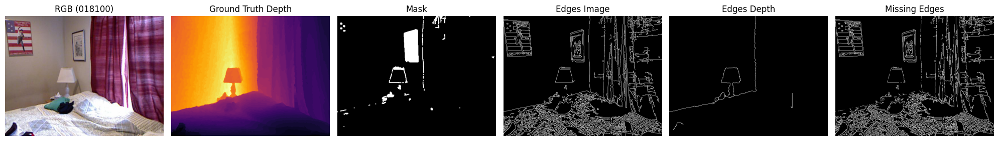

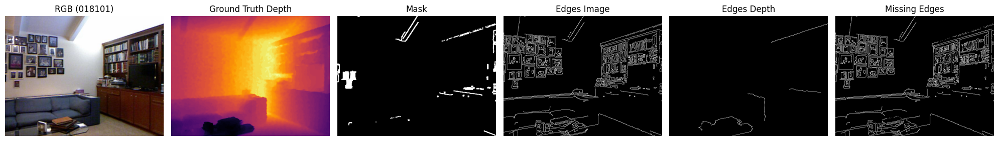

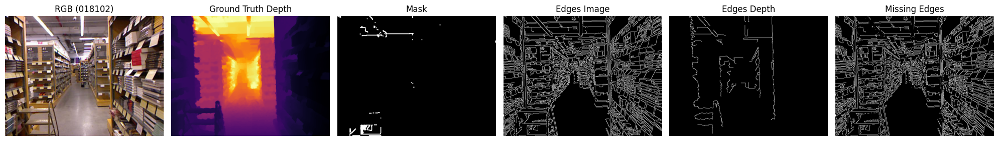

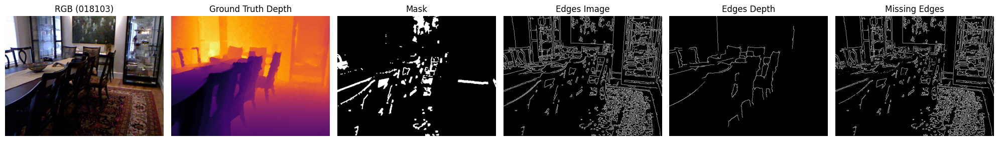

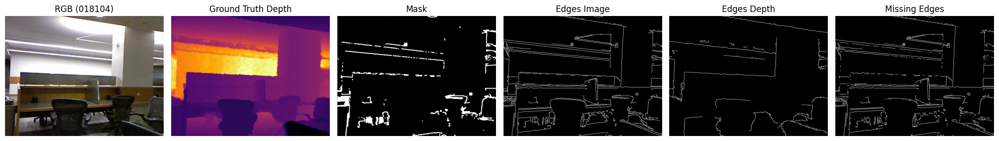

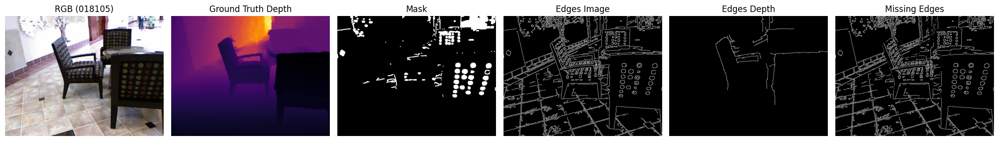

Skipping 018106 (missing files)
Skipping 018107 (missing files)


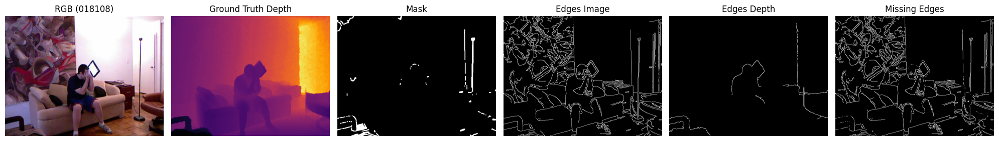

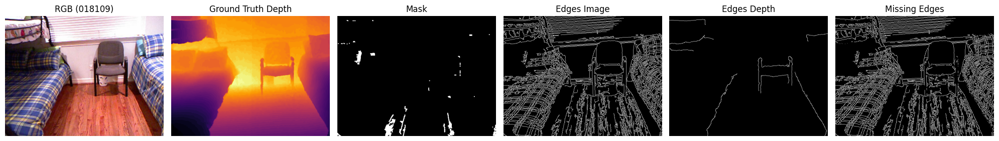

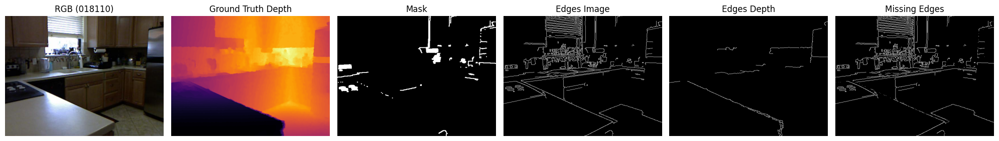

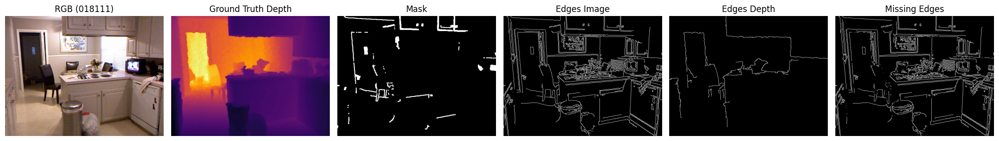

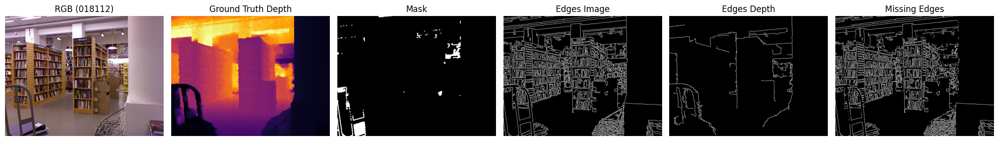

...

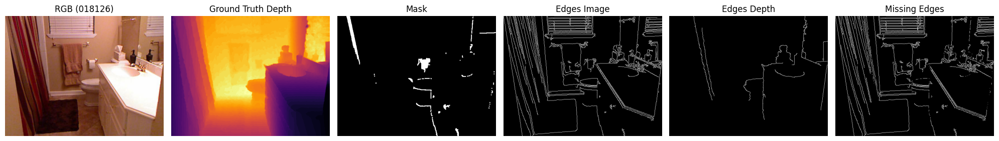

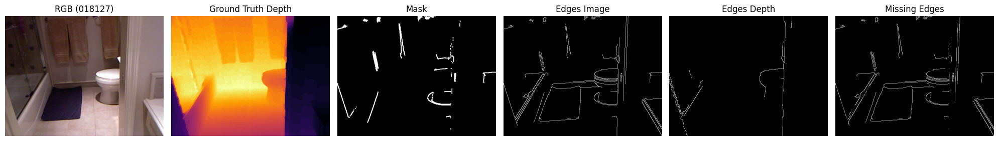

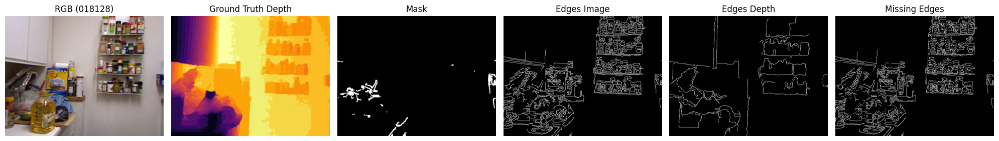

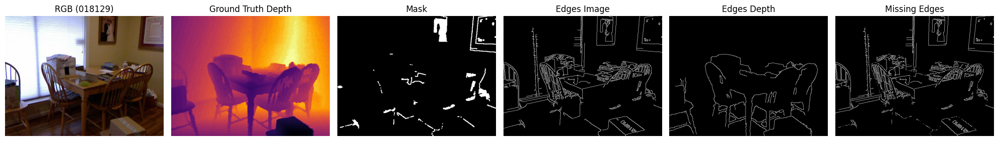

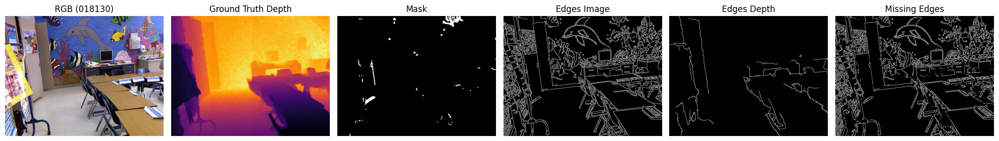

KeyboardInterrupt: 

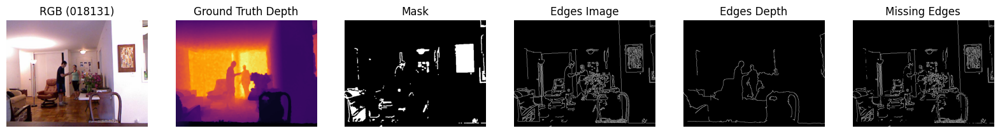

In [69]:
import os
import numpy as np
import torch
from PIL import Image
import matplotlib.pyplot as plt
from transformers import AutoImageProcessor, AutoModelForDepthEstimation

# Setup
# model_id = "depth-anything/Depth-Anything-V2-Metric-Indoor-Base-hf"

# Load model and processor
# processor = AutoImageProcessor.from_pretrained(model_id)
# model = AutoModelForDepthEstimation.from_pretrained(model_id)
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# model.to(device)

# Helper to visualize one sample
def visualize_sample(sample_id):
    rgb_path = os.path.join(TRAIN_DIR, f"sample_{sample_id}_rgb.png")
    depth_path = os.path.join(TRAIN_DIR, f"sample_{sample_id}_depth.npy")

    if not os.path.exists(rgb_path) or not os.path.exists(depth_path):
        print(f"Skipping {sample_id} (missing files)")
        return

    # Load data
    image = Image.open(rgb_path).convert("RGB")
    depth_gt = np.load(depth_path)

    # Predict depth
    # inputs = processor(images=image, return_tensors="pt").to(device)
    #with torch.no_grad():
    #    outputs = model(**inputs)
    #    depth_pred = outputs.predicted_depth

    """
    depth_pred_resized = torch.nn.functional.interpolate(
        depth_pred.unsqueeze(0),
        size=image.size[::-1],
        mode="bicubic",
        align_corners=False
    ).squeeze().cpu().numpy()
    """

    mask, edges_image, edges_depth, missing_edges = rgb_masks_filtering(image, depth_gt)

    # Plot the reflective surface mask
    fig, axes = plt.subplots(1, 6, figsize=(20, 5))
    axes[0].imshow(image)
    axes[0].set_title(f"RGB ({sample_id})")
    axes[0].axis("off")

    im2 = axes[1].imshow(depth_gt, cmap="inferno")
    axes[1].set_title("Ground Truth Depth")
    axes[1].axis("off")

    axes[2].imshow(mask, cmap="gray")
    axes[2].set_title("Mask")
    axes[2].axis("off")

    axes[3].imshow(edges_image, cmap="gray")
    axes[3].set_title("Edges Image")
    axes[3].axis("off")

    axes[4].imshow(edges_depth, cmap="gray")
    axes[4].set_title("Edges Depth")
    axes[4].axis("off")

    axes[5].imshow(missing_edges, cmap="gray")
    axes[5].set_title("Missing Edges")
    axes[5].axis("off")

    plt.tight_layout()
    plt.show()


# Loop over samples in range
for i in range(18100, 18200):  # 024212 inclusive
    sample_id = f"{i:06d}"
    visualize_sample(sample_id)


In [ ]:
import os
import numpy as np
import torch
from PIL import Image
import matplotlib.pyplot as plt
from transformers import AutoImageProcessor, AutoModelForDepthEstimation

# Setup
model_id = "depth-anything/Depth-Anything-V2-Metric-Indoor-Base-hf"

# Load model and processor
processor = AutoImageProcessor.from_pretrained(model_id)
model = AutoModelForDepthEstimation.from_pretrained(model_id)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Helper to visualize one sample
def visualize_sample(sample_id):
    rgb_path = os.path.join(TRAIN_DIR, f"sample_{sample_id}_rgb.png")
    depth_path = os.path.join(TRAIN_DIR, f"sample_{sample_id}_depth.npy")

    if not os.path.exists(rgb_path) or not os.path.exists(depth_path):
        print(f"Skipping {sample_id} (missing files)")
        return

    # Load data
    image = Image.open(rgb_path).convert("RGB")
    depth_gt = np.load(depth_path)

    # Predict depth
    inputs = processor(images=image, return_tensors="pt").to(device)
    with torch.no_grad():
        outputs = model(**inputs)
        depth_pred = outputs.predicted_depth

    depth_pred_resized = torch.nn.functional.interpolate(
        depth_pred.unsqueeze(0),
        size=image.size[::-1],
        mode="bicubic",
        align_corners=False
    ).squeeze().cpu().numpy()

    # Compute absolute error between prediction and ground truth
    abs_error = np.abs(depth_pred_resized - depth_gt)

    # Threshold the error to identify reflective/erroneous regions
    error_threshold = 0.3 * (np.max(depth_gt) - np.min(depth_gt))
    mask_reflective = abs_error > error_threshold

    # Save the reflective mask as a .npy file
    save_path = os.path.join("/content/masks", f"sample_{sample_id}_reflective_mask.npy")
    os.makedirs(os.path.dirname(save_path), exist_ok=True)  # Create directory if it doesn't exist
    np.save(save_path, mask_reflective.astype(np.uint8))    # Save as uint8 binary mask


# Loop over samples in range
for i in range(1, 50000):  # 024212 inclusive
    sample_id = f"{i:06d}"
    visualize_sample(sample_id)


Skipping 000105 (missing files)
Skipping 000261 (missing files)
Skipping 000274 (missing files)
Skipping 000280 (missing files)
Skipping 000442 (missing files)
Skipping 000514 (missing files)
Skipping 000625 (missing files)
Skipping 000778 (missing files)
Skipping 000797 (missing files)
Skipping 000901 (missing files)
Skipping 000915 (missing files)
Skipping 000931 (missing files)
Skipping 001065 (missing files)
Skipping 001218 (missing files)
Skipping 001310 (missing files)
Skipping 001364 (missing files)
Skipping 001383 (missing files)
Skipping 001387 (missing files)
Skipping 001550 (missing files)
Skipping 001590 (missing files)
Skipping 001773 (missing files)
Skipping 001775 (missing files)
Skipping 001836 (missing files)
Skipping 002017 (missing files)
Skipping 002044 (missing files)
Skipping 002076 (missing files)
Skipping 002374 (missing files)
Skipping 002398 (missing files)
Skipping 002482 (missing files)
Skipping 002644 (missing files)
Skipping 002647 (missing files)
Skipping

KeyboardInterrupt: 